# Proyecto: Análisis de mercado inmobiliario

¡Bienvenido/a al primer proyecto de la carrera de Data Science de Acamica! 

El objetivo de este proyecto es reproducir los pasos que haría un/a Data Scientist cuando se enfrenta a una problemática real. Por eso, consta de tres secciones:
* En la Parte 1, te presentamos la problemática sobre la cual vas a trabajar. En esta sección deberás decidir qué datos te ayudarán a trabajar en este problema y dónde puedes conseguirlos.
* En la Parte 2 te proveemos de un dataset para abordar la problemática planteada. Deberás realizar un Análisis Exploratorio de Datos sobre este dataset.
* En la Parte 3, deberás utilizar herramientas de Machine Learning para predecir la variable de interés.


En este proyecto vas a trabajar con un dataset de propiedades en venta publicado en el portal [Properati](www.properati.com.ar).

**Importante:** recuerda que un notebook es un informe, por lo que debes ir explicando lo que haces a medida que resuelves las consignas. Es importante que quien que lo lea entienda el flujo de trabajo, qué quisiste hacer. Recuerda, simple y conciso es una combinación ganadora. 

## Problema

Recientemente te has incorporado al equipo de Datos de una gran inmobiliaria. La primera tarea que se te asigna es ayudar a los tasadores/as a valuar las propiedades, ya que es un proceso difícil y, a veces, subjetivo. Para ello, propones crear un modelo de Machine Learning que, dadas ciertas características de la propiedad, prediga su precio de venta.

### 1. Pensando como un/a Data Scientist

Responde la siguientes pregunta:
1. ¿Qué datos crees que te ayudarían a trabajar en el problema?¿Por qué?

**Importante**: NO deberás buscar esos datos, solamente justificar qué información crees que te ayudaría a resolver la problemática planteada.

**COMPLETA EN ESTA CELDA TU RESPUESTA**
- Ubicacion y estrato socio economico del mismo
- Metros cubiertos
- Año de contruccion
- Tamaño del lugar 
- Materiales de construccion
- Amerities
- Cercania de lugares importantes (ej. centro de la ciudad)

### 2. Análisis Exploratorio de Datos

Análisis Exploratorio de Datos sobre el dataset de propiedades de Properati


0. Importa las librerías necesarias para trabajar en la consigna.

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

1. Carga el dataset usando las funcionalidades de Pandas. Imprimir cuántas filas y columnas tiene, y sus cinco primeras instancias.

In [6]:
data = pd.read_csv('DS_Proyecto_01_Datos_Properati 1.csv')

FileNotFoundError: [Errno 2] No such file or directory: 'DS_Proyecto_01_Datos_Properati 1.csv'

In [3]:
data.head()

,start_date,end_date,created_on,lat,lon,l1,l2,l3,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,currency,title,description,property_type,operation_type
0,2019-10-17,2019-12-23,2019-10-17,-34.605880,-58.384949,Argentina,Capital Federal,San Cristobal,7.0,7.0,2.0,140.0,140.0,153000.0,USD,"***Venta semipiso centro, ideal hostel*****",DESCRIPCION DE LA PROPIEDAD: Departamento de 1...,Departamento,Venta
1,2019-10-17,2019-11-21,2019-10-17,-34.624056,-58.412110,Argentina,Capital Federal,Boedo,2.0,1.0,2.0,70.0,58.0,159000.0,USD,Espectacular PH reciclado en Boedo sin expensas.,PH reciclado en Boedo a una cuadra de la plaz...,PH,Venta
2,2019-10-17,2019-11-01,2019-10-17,-34.593569,-58.427474,Argentina,Capital Federal,Palermo,2.0,1.0,1.0,45.0,45.0,125000.0,USD,Depto.tipo casa de 2 ambientes en Venta en Pal...,"2 ambienets amplio , excelente estado , patio ...",PH,Venta
3,2019-10-17,2019-12-23,2019-10-17,-34.581294,-58.436754,Argentina,Capital Federal,Palermo,2.0,1.0,1.0,85.0,50.0,295000.0,USD,COSTA RICA 5800 / PALERMO HOLLYWOOD / VENTA PH...,HERMOSO PH EN PALERMO!!!2 AMBIENTES TOTALMENTE...,PH,Venta
4,2019-10-17,2020-03-11,2019-10-17,-34.914194,-57.938219,Argentina,Bs.As. G.B.A. Zona Sur,La Plata,2.0,1.0,1.0,50.0,35.0,40000.0,USD,58 entre 1 y 2 Venta de departamento en ph.1 ...,58 entre 1 y 2 Venta de departamento en PH. P...,PH,Venta


In [7]:
#Tipo de datos por variables
data.dtypes

start_date          object
end_date            object
created_on          object
lat                float64
lon                float64
l1                  object
l2                  object
l3                  object
rooms              float64
bedrooms           float64
bathrooms          float64
surface_total      float64
surface_covered    float64
price              float64
currency            object
title               object
description         object
property_type       object
operation_type      object
dtype: object

In [11]:
data["l1"].unique()

array(['Argentina'], dtype=object)

In [10]:
data["operation_type"].unique()

array(['Venta'], dtype=object)

Al visualizar de manera rapida las columnas del dataset podemos decir que algunas variables resultan mas relevantes que otras. Por ejemplo, `lat` y `lon` son dos variables que si bien nos permiten conocer el lugar en donde se encuentra ubicada la propiedad puede individualizar los datos al igual que `description`,`title`, `start_date` y `end_date`.
Por otro lado, en la variable `l1` observamos un solo valor (Argentina) y `operation_type`, es por eso que se procedera a eliminarla ya que no aporta informacion relevante al modelo. Lo mismo ocurre con `currency`, que nos indica unicamente la moneda en la que se encuentran los precios.

2. **Tamaño del DataSet**

In [4]:
data.shape

(146660, 19)

3. **Tipos de propiedad**: ¿Cuántos tipos de propiedad hay publicados según este dataset?¿Cuántos instancias por cada tipo de propiedad hay en el dataset?

Cantidad de tipos de propiedades publicados

In [6]:
len(data["property_type"].value_counts())

10

Mostramos la cantidad de instancias en relacion al tipo de propiedad

In [7]:
data["property_type"].value_counts()

Departamento       107326
Casa                21521
PH                  14298
Lote                 1312
Oficina               658
Otro                  374
Local comercial       325
Casa de campo         322
Depósito              265
Cochera               259
Name: property_type, dtype: int64

Cantidad de propiedades publicadas:

Text(0.5, 1.0, 'Cantidad de propiedades')

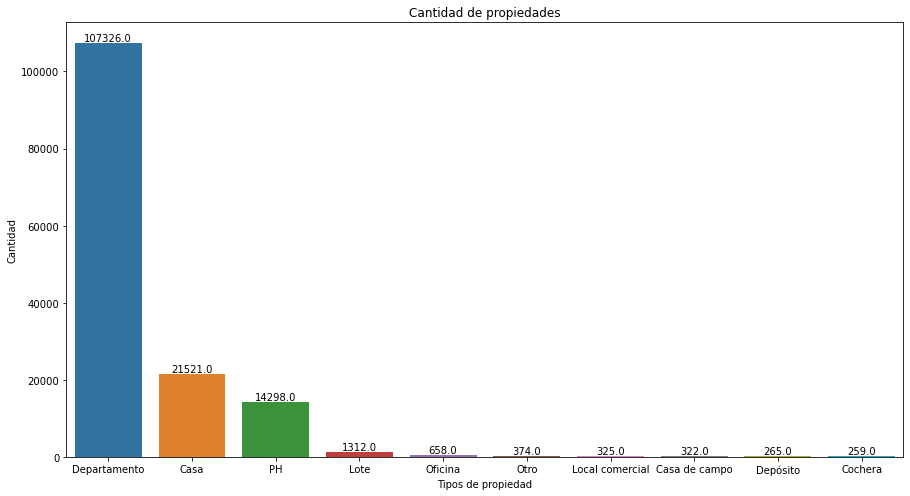

In [8]:
plt.figure(figsize=(15,8))
barras = sns.countplot(data=data, x="property_type",  order = data['property_type'].value_counts().index)
for p in barras.patches:
    barras.annotate(format(p.get_height(), '.1f'),
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 5), 
                   textcoords = 'offset points')

plt.xlabel('Tipos de propiedad')
plt.ylabel('Cantidad')
plt.title('Cantidad de propiedades')

En el grafico anterior podemos observar que la mayor cantidad de publicaciones se distribuyen en los tipos de propiedad: Departamento, Casa y PH.

Los graficos a continuacion muestran las cantidad de propiedades publicadas segun la region geografica y las 15 localidades mas frecuentes

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 <a list of 15 Text major ticklabel objects>)

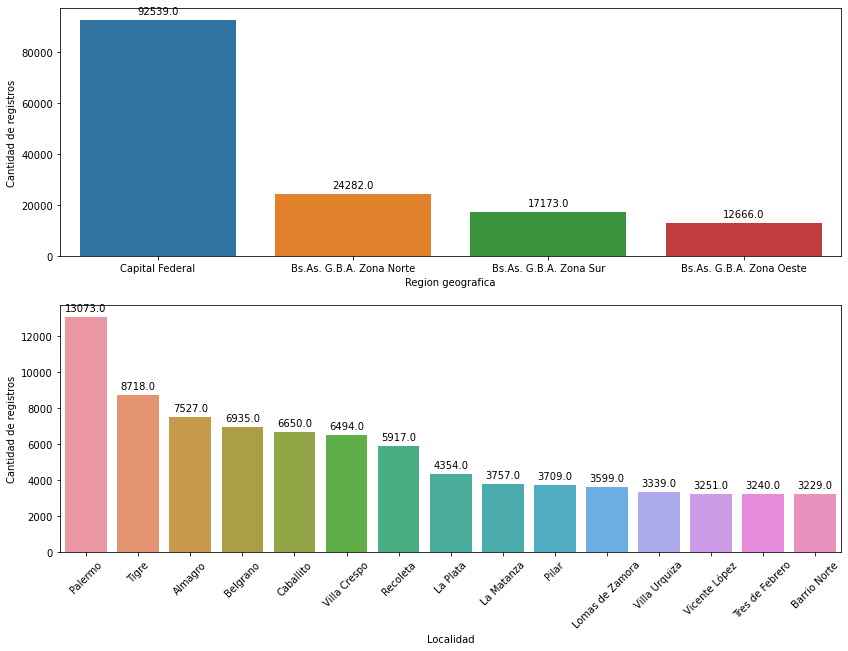

In [9]:
f, axes = plt.subplots(2, 1,figsize=(14,10))

region_geo= sns.countplot(data=data, x="l2", orient = "v", order=data["l2"].value_counts().index, ax=axes[0])
for p in region_geo.patches:
    region_geo.annotate(format(p.get_height(), '.1f'),
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
region_geo.set_xlabel("Region geografica")
region_geo.set_ylabel("Cantidad de registros")

localidad= sns.countplot(data=data, x="l3", orient = "v", order=data["l3"].value_counts().head(15).index, ax=axes[1])
for p in localidad.patches:
    localidad.annotate(format(p.get_height(), '.1f'),
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
localidad.set_xlabel("Localidad")
localidad.set_ylabel("Cantidad de registros")

plt.xticks(rotation=45)

En terminos de Region geografica la mayor cantidad de publicaciones se concentran en Capital Federal.
En relacion a las localidades, las 5 mas frecuentes son: Palermo, Tigre, Almagro, Belgrano y Caballito.

Como mencionamos anteriormente, procederemos a filtrar nuestro dataset eliminando aquellas variables que son irrelevantes para el problema planteado:

In [3]:
data = data.drop(["lan", "lon","description","title", "start_date","end_date", "operation_type", "currency"])

NameError: name 'data' is not defined

In [11]:
data.describe()

,lat,lon,rooms,bedrooms,bathrooms,surface_total,surface_covered,price
count,86951.000000,86937.000000,91485.000000,91485.000000,89314.000000,82568.000000,82250.000000,9.148500e+04
mean,-34.599081,-58.436002,2.964278,1.960278,1.560147,112.626369,94.966310,2.595003e+05
std,0.023957,0.036297,1.314704,1.072946,0.860309,980.713664,778.515243,3.222654e+05
min,-34.696419,-58.530468,1.000000,0.000000,1.000000,10.000000,1.000000,6.000000e+03
25%,-34.613757,-58.459605,2.000000,1.000000,1.000000,49.000000,44.000000,1.200000e+05
50%,-34.599446,-58.433789,3.000000,2.000000,1.000000,71.000000,63.000000,1.750000e+05
75%,-34.584148,-58.410143,4.000000,3.000000,2.000000,111.000000,96.000000,2.790000e+05
max,-34.535818,-58.353930,26.000000,15.000000,14.000000,126062.000000,126062.000000,3.243423e+07


2. **Valores Faltantes**: imprime en pantalla los nombres de las columnas y cuántos valores faltantes hay por columna.

In [5]:
data.isnull().sum()/len(data)

start_date         0.000000
end_date           0.000000
created_on         0.000000
lat                0.067674
lon                0.067905
l1                 0.000000
l2                 0.000000
l3                 0.000000
rooms              0.000000
bedrooms           0.000000
bathrooms          0.040618
surface_total      0.139963
surface_covered    0.147375
price              0.000000
currency           0.000000
title              0.000000
description        0.000000
property_type      0.000000
operation_type     0.000000
dtype: float64

In [13]:
data["property_type"].unique()

array(['Departamento', 'PH', 'Casa', 'Lote', 'Casa de campo', 'Oficina',
       'Otro', 'Local comercial', 'Cochera', 'Depósito'], dtype=object)

Como se muestra en la celda anterior, solo existe 5 variables con datos faltantes: `lat` (6.7%), `lon`(6.7%), `bathrooms`(4%), `surface_total`(13.9%) y `surface_covered`(14.7%). El faltante de estos valores puede deberse a distintas razones.
Por ejemplo los valores nulos en la variable `bathrooms` puede deberse a que uno de los tipos de propiedad son cocheras y lotes (los cuales no poseen baños) esto no significa que falten valores si no que su valor es 0.
Pero en el caso del resto de las variables, puede ser un inconveniente no imputarlas a la hora de crear y entrenar nuestro modelo.

3. **Tipos de propiedad**: ¿Cuántos tipos de propiedad hay publicados según este dataset?¿Cuántos instancias por cada tipo de propiedad hay en el dataset? Responde esta pregunta usando las funcionalidad de Pandas y con un gráfico apropiado de Seaborn. **Pistas**: Te puede ser útil googlear cómo rotar las etiquetas del eje x.

5. **Filtrando el Dataset:** A partir de los resultados del punto 3. y 4., selecciona las tres clases más abundantes de tipos de propiedad y la región con más propiedades publicadas. Crea un nuevo Data Frame con aquellas instancias que cumplen con esas condiciones e imprime su `shape`.

En el siguiente apartado filtramos el Dataset seleccionando las 3 clases mas abundantes de tipos de propiedad (Ph, Departamento y Casa) y la region con mas publicaciones (Capital Federal)

In [10]:
data_caba=data[data.property_type.isin(["PH","Casa","Departamento"]) & data.l2.isin(["Capital Federal"])]
data_caba.shape

(91485, 19)

**Checkpoint:** deberías tener un dataset con 91485 instacias, 19 columnas.

6. **Distribuciones y relaciones de a pares:** Estudia la distribución y las relaciones de a pares de las variables `rooms`, `bedrooms`, `bathrooms`, `surface_total`, `surface_covered`, `price` para cada tipo de propiedad. Para ello, ten en cuenta:
    1. Obtiene estadísticos que te sirvan para tener una primera idea de los valores que abarcan estas variables. ¿Cuáles crees que toman valores que tal vez no tengan mucho sentido?
    1. Algunas instancias tienen valores de superficie (`surface_total`) muy grandes y dificultan la correcta visualización. Estudia la distribución de esa variable y filtra por un valor razonable que te permita obtener gráficos comprensibles. Puede ser útil un boxplot para determinar un rango razonable.
    1. Lo mismo ocurre con valores de superficie total muy chico.
    1. Las propiedades no pueden tener `surface_covered` mayor a `surface_total`. Si eso sucede, debes filtrar esas instancias.
    1. El rango de precios que toman las propiedades es muy amplio. Estudia la distribución de esa variable y filtra por un valor razonable que te permita obtener gráficos comprensibles. Puede ser útil un boxplot para determinar un rango razonable.
    1. Una vez filtrado el dataset, puedes utilizar la función `pairplot` de Seaborn.

Observaremos los datos mas relevantes para tener una primera impresion de estas variables

Con el cuadro presentado anteriormente podemos observar que las variables *Precio* y *Superficie* tiene una desviacion estandar muy grande, lo que significa que sus valores estan muy dispersos, ademas, existe una gran diferencia entre los valores minimos y maximos. Esto puede generar inconvientes a la hora de predecir los precios para las distintas propiedades. 

Analizaremos en un primer momento la variable superficie total:


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 <a list of 15 Text major ticklabel objects>)

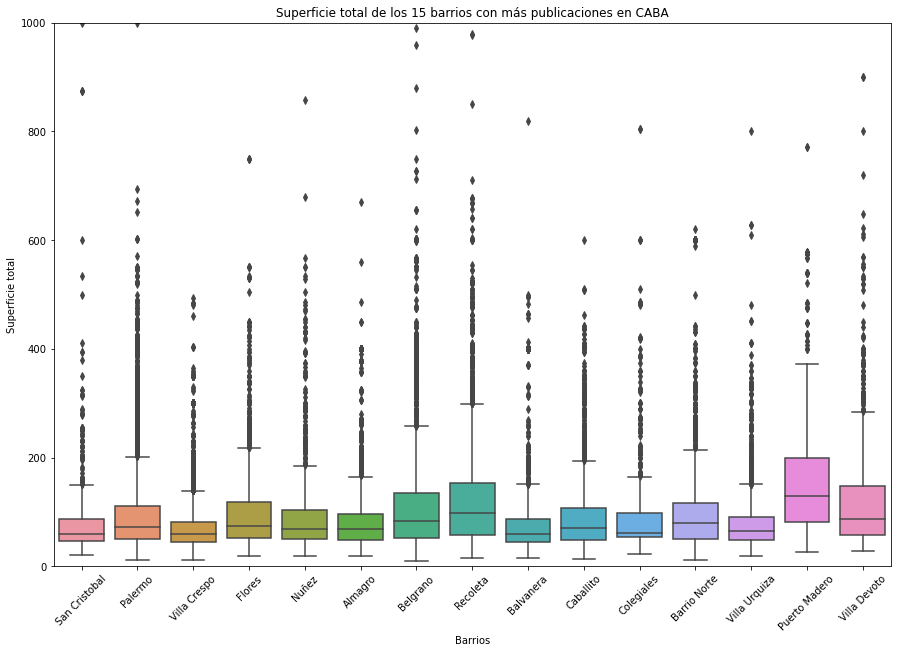

In [12]:
barrios= data_caba["l3"].value_counts()[:15].index

plt.figure(figsize=(15, 10))
sns.boxplot(data = data_caba[data_caba["l3"].isin(barrios)], x = "l3", y = "surface_total")

plt.title("Superficie total de los 15 barrios con más publicaciones en CABA")
plt.xlabel("Barrios")
plt.ylabel("Superficie total")
plt.ylim(0, 1000)
plt.xticks(rotation=45)

Como se pueden observar en en grafico, las colas de los boxplot son muy largas, esto nos da la pauta de que exite una gran cantidad de valores atipicos que pueden sesgar la aplicacion del modelo.

Debido a la clara existencia de outliers, eliminaremos los mismos utilizando cuartiles:

In [13]:
q1, q3 = data_caba['surface_total'].quantile(0.25), data_caba['surface_total'].quantile(0.75)
IQR = q3 - q1

upper = q3 + 1.5 * IQR
lower = q1 - 1.5 * IQR 

data_caba = data_caba[(data_caba.surface_total > lower) & (data_caba.surface_total < upper)]

In [14]:
data_caba.shape

(76236, 19)

Corroboramos que efectivamente se hayan eliminado estos valores atipicos

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 <a list of 15 Text major ticklabel objects>)

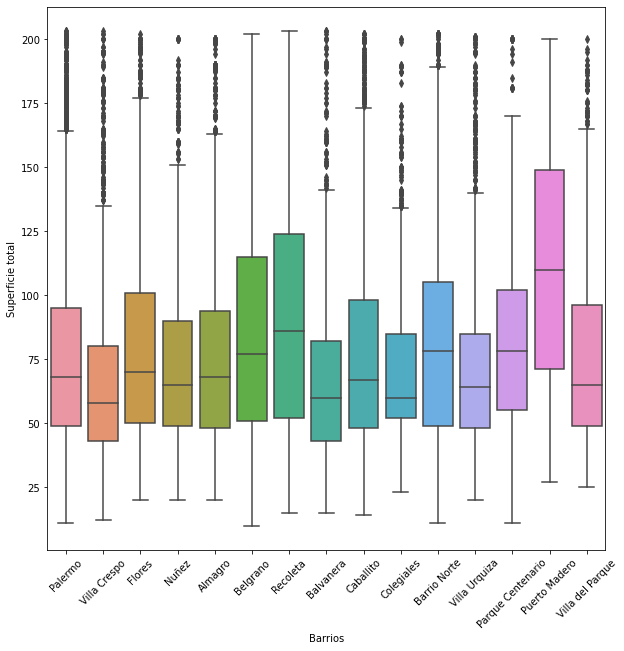

In [15]:
barrios= data_caba["l3"].value_counts()[:15].index

plt.figure(figsize=(10, 10))
sns.boxplot(data = data_caba[data_caba["l3"].isin(barrios)], x = "l3", y = "surface_total")
plt.xlabel("Barrios")
plt.ylabel("Superficie total")
plt.xticks(rotation=45)

Corroboramos que no existan valores donde la superfice cubierta es mayor a la superficie total:

In [16]:
data_caba= data_caba[data_caba["surface_covered"] <= data_caba["surface_total"]]

In [17]:
data_caba.shape

(75073, 19)

A continuacion, con los siguientes graficos veremos como se comportan los precios en funcion a los tipos de propiedades, cantidad de habitaciones y localidades mas frecuentes:

Text(0.5, 1.0, 'Relacion tipo de propiedad y precio')

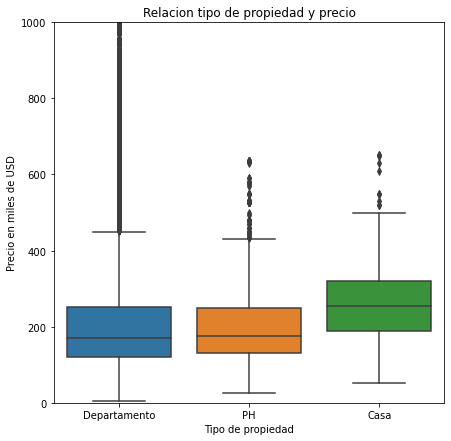

In [18]:
plt.figure(figsize=(7,7))
grafico_pro = sns.boxplot(y=(data_caba.price/1000), x=data_caba.property_type)
grafico_pro.set(ylim=(0, 1000))
grafico_pro.set_xlabel("Tipo de propiedad")
grafico_pro.set_ylabel("Precio en miles de USD")
grafico_pro.set_title("Relacion tipo de propiedad y precio")


En este grafico se busca poder relacionar la variable precios con los 3 tipos de propiedades mas frecuentes (Departamento, Casa y Ph).

Text(0.5, 1.0, 'Relacion localidades y precio')

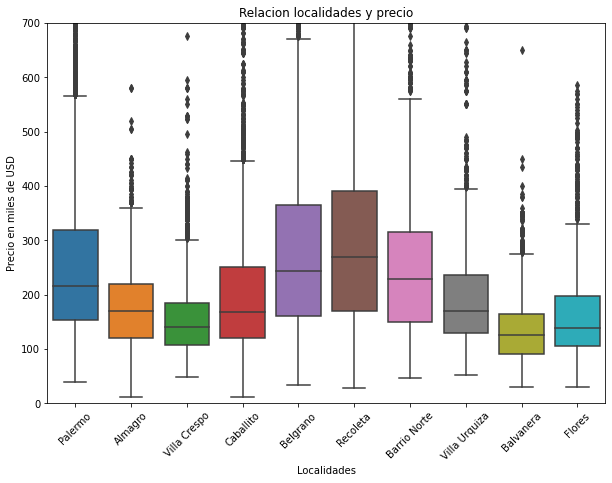

In [19]:
plt.figure(figsize=(10,7))
grafico_l3 = sns.boxplot(y=(data_caba.price/1000), x=data_caba.l3, order=data_caba.l3.value_counts().head(10).index)
grafico_l3.set(ylim=(0, 700))

plt.xticks(rotation=45)

plt.xlabel("Localidades")
plt.ylabel("Precio en miles de USD")
plt.title("Relacion localidades y precio")

En el grafico anterior se busco conocer la relacion existente entre los precios de las propiedades y las 10 localidades con mas publicaciones.

Text(0.5, 0, 'Cantidad de habitaciones')

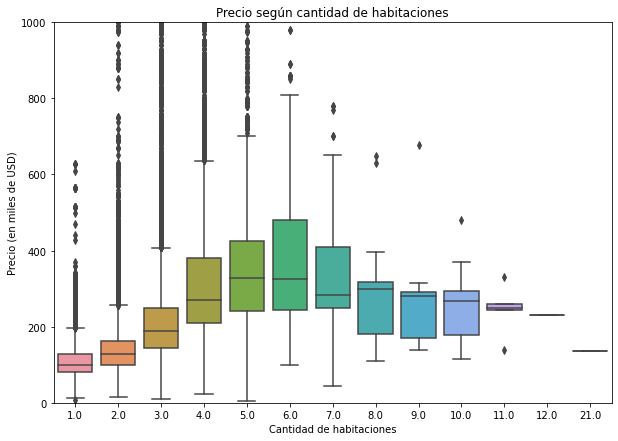

In [20]:
plt.figure(figsize=(10,7))
grafico_hab = sns.boxplot(data=data_caba, y=(data_caba.price/1000), x=data_caba.rooms)
grafico_hab.set(ylim=(0, 1000))

grafico_hab.set_title("Precio según cantidad de habitaciones")
grafico_hab.set_ylabel("Precio (en miles de USD)")
grafico_hab.set_xlabel("Cantidad de habitaciones")

Por ultimo en este grafico vemos la relacion entre los precios y los distintas cantidades de habitaciones.
Como conclusion, y como puedimos observar en los ultimos graficos, al igual que en la variable superficie total, existe una gran dispersion de valores (Precio) que dificultan su entendimiento y modelaje.

In [21]:
data_caba.describe()

,lat,lon,rooms,bedrooms,bathrooms,surface_total,surface_covered,price
count,71352.000000,71352.000000,75073.000000,75073.000000,74311.000000,75073.000000,75073.000000,7.507300e+04
mean,-34.598327,-58.435271,2.822439,1.864039,1.442505,78.192666,69.223902,2.146661e+05
std,0.023099,0.035199,1.078229,0.907700,0.706451,39.816514,34.658062,1.943051e+05
min,-34.695087,-58.530467,1.000000,0.000000,1.000000,12.000000,1.000000,6.000000e+03
25%,-34.611969,-58.457311,2.000000,1.000000,1.000000,48.000000,43.000000,1.200000e+05
50%,-34.598956,-58.433058,3.000000,2.000000,1.000000,67.000000,60.000000,1.700000e+05
75%,-34.584772,-58.411296,4.000000,2.000000,2.000000,99.000000,85.000000,2.549000e+05
max,-34.535909,-58.353930,21.000000,15.000000,14.000000,203.000000,203.000000,3.243423e+07


Debido a la presencia de precios tan dispersos (outliers), se procedera a eliminarlos para facilitar asi su estudio

In [22]:
q1, q3 = data_caba['price'].quantile(0.25), data_caba['price'].quantile(0.75)
IQR_price = q3 - q1

upper_price = q3 + 1.5 * IQR_price
lower_price = q1 - 1.5 * IQR_price

data_caba = data_caba[(data_caba.price > lower_price) & (data_caba.price < upper_price)]

In [23]:
data_caba.shape

(70543, 19)

Por ultimo, realizaremos un pairplot filtrando las variables de interes (rooms, bedrooms, bathrooms, surface_covered, surface_total y price)

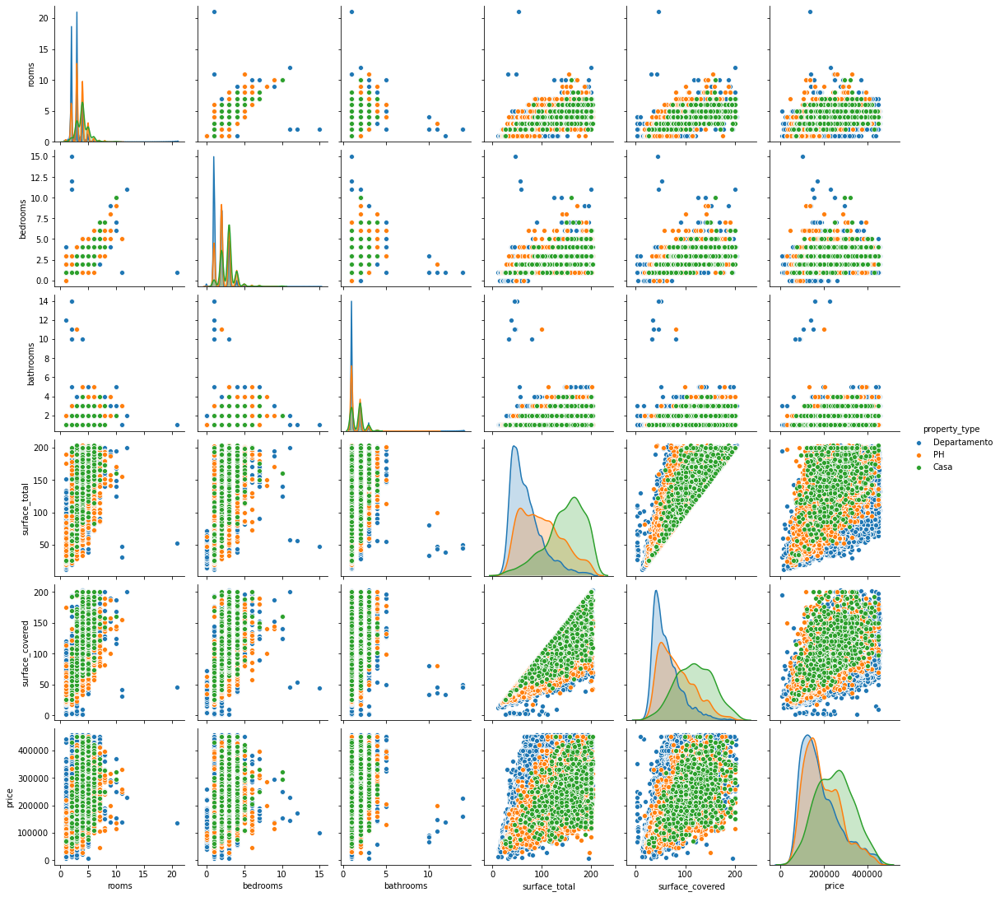

In [24]:
sns.pairplot(data_caba[["rooms", "bedrooms", 
                                    "bathrooms", "surface_total", 
                                    "surface_covered", "price", "property_type"]], hue = "property_type")
plt.show()

Este grafico busca representar la relacion entre las variables mas relevantes y como es la dispersion de sus datos teniendo en cuenta el tipo de propiedad (donde el azul corresponde a los departamentos, verde a las casa y naranja a los PH).

Si nos enfocamos en los graficos ubicados en la diagonal podremos percebir que tan sesgados estan los datos en funcion a la media (promedio). Por ejemplo,con respecto a la variable `price` (precio) podemos decir que las Casas poseen una distribucion normal en relacion a la media, mientras que los Departamentos y PH poseen un sesgo negativo, es decir, los valores observados son mas bajos que el promedio.

7. **Correlaciones:** Estudia la correlación entre las variables `rooms`, `bedrooms`, `bathrooms`, `surface_total`, `surface_covered`, `price`. ¿Cuáles son las mejores variables para predecir el precio?¿Qué diferencias encuentras según cada tipo de propiedad?

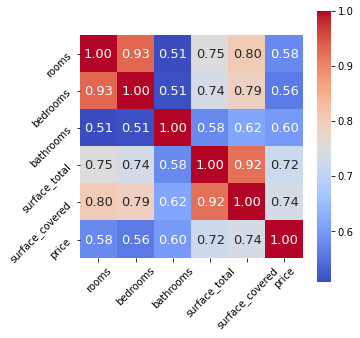

In [25]:
data_corr = data_caba[["rooms", "bedrooms", "bathrooms", "surface_total", "surface_covered", "price"]]

corr = data_corr.corr()
plt.figure(figsize=(5,5))
sns.heatmap(corr, cbar = True,  square = True, annot=True, fmt= '.2f',annot_kws={'size': 13},
           xticklabels= data_corr.columns, 
           yticklabels= data_corr.columns,
           cmap= 'coolwarm')
plt.xticks(rotation = 45)
plt.yticks(rotation = 45)
plt.show()

In [26]:
data_caba.shape

(70543, 19)

Mapa de precios en CABA:

In [27]:
import plotly.express as px

In [28]:
fig = px.scatter_mapbox(data_caba, lat="lat", lon="lon", hover_name="property_type",
                        color="price",size="surface_total",
                        color_continuous_scale=px.colors.cyclical.Edge, size_max=8, zoom=10)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

En este grafico podemos observar aquellas zonas mas caras de CABA en funcion a al color con el que estan pintadas. Por ejemplo donde encontramos un tono rojo oscuro son las publicaciones de propiedades mas caras, el color azul oscuro son aquellas mas economicas.

### 2.1 Desafío

En el dataset provisto hay mucha información, más allá del problema planteado. Propone una pregunta que pueda ser respondida por el dataset e intenta responderla.¿Cuáles son los sesgos de la respuesta obtenida?(¿Cuán generalizable es la respuesta obtenida?)¿Necesitas información complementaria?¿Cómo la obtendrías?

Por ejemplo: ¿Cuál es el barrio más caro de Buenos Aires? Probablemente puedas responder esta pregunta con este dataset. Pero podria ocurrir que la respuesta esté sesgada. ¿Cómo? Tal vez las propiedades más caras no se publican de forma online, sino que utilizan otro canal de venta.


*Promedio del metro cuadrado para la Departamentos de la localidad de Palermo:*


In [29]:
data_depto_palermo = data_caba[data_caba.l3.isin(["Palermo"]) & data_caba.property_type.isin(["Departamento"])]

In [30]:
m2 = (data_depto_palermo.price)/(data_depto_palermo.surface_total)

In [31]:
promedio_m2= m2.mean()
print("Promedio del metro cuadrado para Departamentos en Palermo es de $",promedio_m2)

Promedio del metro cuadrado para Departamentos en Palermo es de $ 3230.052283383309


*Una desventaja de este dato es que el mismo puede estar sesgado por los valores maximos y minimos tanto del precio como de la superficie total.*

### 3. Machine Learning

En esta sección, debes entrenar dos modelos de Machine Learning - uno de vecinos más cercanos y otro de árboles de decisión -  para predecir el precio de las propiedades tipo `Departamento`, `PH` y `Casa`  en la Ciudad Autónoma de Buenos Aires (`Capital Federal`). Para ello, no debes olvidarte de:

* Elegir una métrica apropiada para evaluar los resultados de los modelos.
* Seleccionar las variables predictoras (`X`) y la variable a predecir (`y`). 
* Realizar un Train/Test split de los datos.
* Generar un modelo *benchmark* y evaluarlo.
* Entrenar un modelo de vecinos más cercanos y un modelo de árbol de decisión con hiperparámetros iniciales de su elección.
* Evaluar los modelos obtenidos. Para ello, evalúa la métrica elegida en el conjunto de Test y en el conjunto de Train. También, realiza gráficos de valores reales vs. valores predichos.
* Mejorar el desempeño de sus modelos optimizando el número de vecinos y la profundidad del árbol, respectivamente.
* Entre los modelos entrenados, ¿cuál elegirías para utilizar?¿Por qué? 
* Ser **crítico/a** con la metodología utilizada. Por ejemplo, responde las siguientes preguntas: ¿Qué información no estás usando que podría ayudar al modelo?¿Qué información puede estar demás o repetida?

Estos lineamientos corresponden al **mínimo entregable** de esta sección.


**Importante:** para asegurarnos que trabajes con un dataset apropiados, debes volver a cargar los datos y realizar el siguiente filtrado:

1. Selecciona aquellas propiedades en Capital Federal y cuyo tipo de propiedad es Departamento, PH o Casa.
1. Selecciona aquellas propiedades cuya superficie total es menor a 1000 m2 y mayor a 15 m2.
1. Selecciona aquellas propiedades cuya precio es menor 4000000 dólares.
1. Selecciona las columnas `rooms`, `bedrooms`, `bathrooms`, `surface_total`, `surface_covered` y `price`.
1. Descarta aquellas instacias con valores faltantes.

**Checkpoint:** deberías obtener un dataset con 81019 instacias y 6 columnas.

In [15]:
data = pd.read_csv('DS_Proyecto_01_Datos_Properati 1.csv')
data.head()

,start_date,end_date,created_on,lat,lon,l1,l2,l3,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,currency,title,description,property_type,operation_type
0,2019-10-17,2019-12-23,2019-10-17,-34.605880,-58.384949,Argentina,Capital Federal,San Cristobal,7.0,7.0,2.0,140.0,140.0,153000.0,USD,"***Venta semipiso centro, ideal hostel*****",DESCRIPCION DE LA PROPIEDAD: Departamento de 1...,Departamento,Venta
1,2019-10-17,2019-11-21,2019-10-17,-34.624056,-58.412110,Argentina,Capital Federal,Boedo,2.0,1.0,2.0,70.0,58.0,159000.0,USD,Espectacular PH reciclado en Boedo sin expensas.,PH reciclado en Boedo a una cuadra de la plaz...,PH,Venta
2,2019-10-17,2019-11-01,2019-10-17,-34.593569,-58.427474,Argentina,Capital Federal,Palermo,2.0,1.0,1.0,45.0,45.0,125000.0,USD,Depto.tipo casa de 2 ambientes en Venta en Pal...,"2 ambienets amplio , excelente estado , patio ...",PH,Venta
3,2019-10-17,2019-12-23,2019-10-17,-34.581294,-58.436754,Argentina,Capital Federal,Palermo,2.0,1.0,1.0,85.0,50.0,295000.0,USD,COSTA RICA 5800 / PALERMO HOLLYWOOD / VENTA PH...,HERMOSO PH EN PALERMO!!!2 AMBIENTES TOTALMENTE...,PH,Venta
4,2019-10-17,2020-03-11,2019-10-17,-34.914194,-57.938219,Argentina,Bs.As. G.B.A. Zona Sur,La Plata,2.0,1.0,1.0,50.0,35.0,40000.0,USD,58 entre 1 y 2 Venta de departamento en ph.1 ...,58 entre 1 y 2 Venta de departamento en PH. P...,PH,Venta


Filtrados :

In [16]:
#Region con mas publicaciones (Capital Federal) y los 3 tipos de propiedades mas frecuentes (Ph, Casa y Departamento)
data_filtrado= data[data.property_type.isin(["PH","Casa","Departamento"]) & data.l2.isin(["Capital Federal"])]
#Superficie total debe ser menor que 1000m2 y mayor que 15m2
data_filtrado=data_filtrado[(data_filtrado.surface_total<=1000) & (data_filtrado.surface_total>=15)]
#Precios menores que $4.000.000
data_filtrado=data_filtrado[data_filtrado.price <= 4000000]
#Seleccion de variables relevantes de estudio
data_filtrado = data_filtrado[["rooms", "bedrooms", "bathrooms", "surface_total", "surface_covered", "price"]]
#Valores nulos
data_filtrado.isna().sum()
#Elimanar datos nulos
data_filtrado= data_filtrado.dropna()

Corroboramos que se haya filtrado correctamente

In [17]:
data_filtrado.describe()

,rooms,bedrooms,bathrooms,surface_total,surface_covered,price
count,81019.000000,81019.000000,81019.000000,81019.000000,81019.000000,8.101900e+04
mean,3.009652,2.002037,1.553821,95.361779,84.928535,2.637725e+05
std,1.308602,1.049673,0.852672,77.253578,156.133119,2.989499e+05
min,1.000000,0.000000,1.000000,15.000000,1.000000,6.000000e+03
25%,2.000000,1.000000,1.000000,49.000000,44.000000,1.250000e+05
50%,3.000000,2.000000,1.000000,71.000000,63.000000,1.800000e+05
75%,4.000000,3.000000,2.000000,111.000000,96.000000,2.800000e+05
max,26.000000,15.000000,14.000000,1000.000000,17220.000000,4.000000e+06


In [120]:
data_filtrado.shape

(81019, 6)

Modelo **Arboles de Decision**

Importamos Arboles de Decision Regresion:

In [18]:
from sklearn.tree import DecisionTreeRegressor

Como variables predictivas se eliminaron cantidad de habitaciones (Rooms), Superficie cubierta (Surface_covered) y Precio (price). Ya que presentaban alta correlacion con otras variables y esto generaba redundancia en el modelo.

In [19]:
X, y = data_filtrado.drop(["surface_covered","rooms","price"], axis=1), data_filtrado["price"]

Separamos el data set en conjunto de entrenamiento (Train) y conjunto de testeo (Test), donde el 70% corresponde al grupo de Train y un 30% al Test

In [20]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7,test_size=0.3, random_state=0)

Definimos como metrica de evavluacion el RMSE (Raiz del error cuadratico medio). Este nos indica cuan cerca estan los datos observados de los valores predichos por el modelo. Dedido a que es un error, el mismo se busca minimizar, es decir, valores menores de RMSE indican un mejor ajuste. Para poder comparar los modelos ultilizaremos la misma metrica de evalucion en todos ellos.

In [21]:
from sklearn.metrics import mean_squared_error

Evaluamos las distintas profundidades del arbol con respecto al RMSE

In [22]:
#Definimos las lisltas vacias para los valores de RSME
lista_tree_train=[]
lista_tree_test=[]

#Definimos la lista los distintos valores de profundidad del arbol de decision
max_depths=[1,2,3,4,5,6,7,8,9,10,12,14,20]

# Generamos un loop sobre los distintos valores de profundidad del arbol
for max_depth in max_depths:
    
    #Definimos el modelo de arbol de decision
    tree=DecisionTreeRegressor(max_depth=max_depth)
    
    #Entrenamos el modelo
    tree.fit(X_train,y_train)
    
    #Predecir el modelo y calcular el RMSE de entrenamiento
    y_train_pred=tree.predict(X_train)
    rmse_train_tree = np.sqrt(mean_squared_error(y_train, y_train_pred))
    
    #Predecimos el modelo y evaluamos el RMSE de evaluacion
    y_test_pred=tree.predict(X_test)
    rmse_test_tree = np.sqrt(mean_squared_error(y_test, y_test_pred))
    
    #Agregamos la informacion a las listas
    lista_tree_train.append(rmse_train_tree)
    lista_tree_test.append(rmse_test_tree)
    
    #Observamos los valores obtenidos para cada max_depth
    print("RMSE Train:", rmse_train_tree)
    print("RMSE Test:", rmse_test_tree)
    
    

RMSE Train: 244558.78657752494
RMSE Test: 239347.1316198491
RMSE Train: 214316.10636205174
RMSE Test: 209415.99882994642
RMSE Train: 201855.80189753106
RMSE Test: 196490.36693985126
RMSE Train: 193372.7363928871
RMSE Test: 189099.6012653256
RMSE Train: 183462.65151957996
RMSE Test: 180287.96273217077
RMSE Train: 175978.52907990248
RMSE Test: 175000.03641338783
RMSE Train: 170925.02690376266
RMSE Test: 173348.33111641867
RMSE Train: 164070.33180453564
RMSE Test: 170536.31920071677
RMSE Train: 157340.1659981182
RMSE Test: 169523.52981571874
RMSE Train: 147981.56852069809
RMSE Test: 164820.25621089674
RMSE Train: 132771.0584793066
RMSE Test: 160157.7302030541
RMSE Train: 121596.11905219663
RMSE Test: 159162.71081371378
RMSE Train: 112262.46345445125
RMSE Test: 157372.94094377977


Graficamos la curvas de validacion para observar la profundidad del arbol ideal:

Text(0, 0.5, 'RMSE')

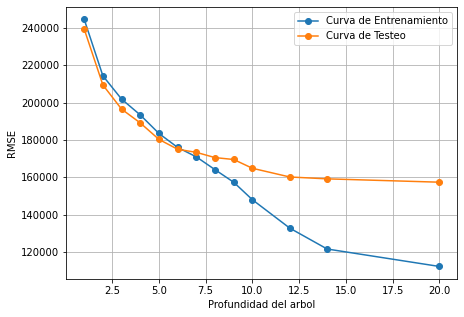

In [23]:
plt.figure(figsize=(7,5))
plt.plot(max_depths,lista_tree_train,"o-",label="Curva de Entrenamiento")
plt.plot(max_depths,lista_tree_test,"o-",label="Curva de Testeo")
plt.grid()
plt.legend()
plt.xlabel("Profundidad del arbol")
plt.ylabel("RMSE")

Conclusion: La profundidad del arbol optima es de 6 (con un RMSE de entrenamiento de: 175978.52 y un RMSE de testeo de 175000.03), en este punto podemos observar que si incrementamos la profundidad el RMSE de la curva de testeo comienza a ser mayor que el de entrenamiento y mientras el segundo continua decreciendo el primero comienza a estabilizarse. 

Modelo **K-vecinos mas cercanos**

Separamos nuevamente nuestras variables predictivas y target:

In [24]:
X, y = data_filtrado.drop(["surface_covered","rooms","price"], axis=1), data_filtrado["price"]

Importamos el modelo:

In [25]:
from sklearn.neighbors import KNeighborsRegressor

Evaluamos el numero de vecinos optimo:

In [26]:
#Definimos las lisltas vacias para los valores de RSME
lista_knn_train=[]
lista_knn_test=[]

#Definimos la lista los distintas cantidades de vecinos
n_neighbors=[1,2,3,4,5,6,7,8,9,10,12,14,20]

# Generamos un loop sobre los distintos valores
for n_neighbors in n_neighbors:
    
    #Definimos el modelo de k-vecinos mas cercanos
    knn = KNeighborsRegressor(n_neighbors= n_neighbors)
    
    #Entrenamos el modelo
    knn.fit(X_train,y_train)
    
    #Predecir el modelo y calcular el RMSE de entrenamiento
    y_train_pred=knn.predict(X_train)
    rmse_train_knn = np.sqrt(mean_squared_error(y_train, y_train_pred))
    
    #Predecimos el modelo y evaluamos el RMSE de evaluacion
    y_test_pred=knn.predict(X_test)
    rmse_test_knn = np.sqrt(mean_squared_error(y_test, y_test_pred))
    
    #Agregamos la informacion a las listas
    lista_knn_train.append(rmse_train_knn)
    lista_knn_test.append(rmse_test_knn)
    
    #Observamos los valores obtenidos para cada n_neigthbors
    print("RMSE Train:", rmse_train_knn)
    print("RMSE Test:", rmse_test_knn)
    

RMSE Train: 156527.36078289457
RMSE Test: 192836.4369708993
RMSE Train: 142406.04052116285
RMSE Test: 177122.20540359686
RMSE Train: 140296.94967600793
RMSE Test: 172050.5114012357
RMSE Train: 143569.564381464
RMSE Test: 171758.88225163188
RMSE Train: 144878.5309839736
RMSE Test: 171165.4135599542
RMSE Train: 147224.40579923798
RMSE Test: 170123.87962270487
RMSE Train: 149566.3802679726
RMSE Test: 170741.0315438809
RMSE Train: 151883.16639442905
RMSE Test: 171149.18201533044
RMSE Train: 154434.99378477485
RMSE Test: 172447.41358770785
RMSE Train: 156524.81320409192
RMSE Test: 173016.75985248128
RMSE Train: 160354.31042492267
RMSE Test: 174087.81410043788
RMSE Train: 162564.21867457643
RMSE Test: 174411.54146189726
RMSE Train: 167740.86818743253
RMSE Test: 176092.2276433904


Text(0, 0.5, 'RMSE')

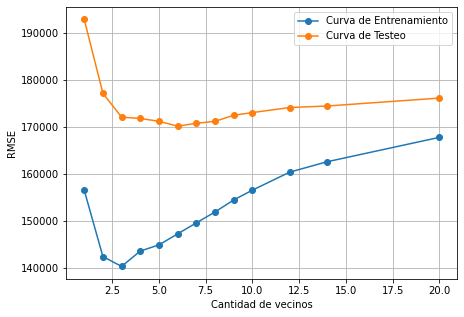

In [27]:
plt.figure(figsize=(7,5))
plt.plot(max_depths, lista_knn_train,"o-",label="Curva de Entrenamiento")
plt.plot(max_depths, lista_knn_test,"o-",label="Curva de Testeo")
plt.grid()
plt.legend()
plt.xlabel("Cantidad de vecinos")
plt.ylabel("RMSE")

Conclusion: La cantidad de vecinos optima es de 3, tal y como podemos observar en el grafico a medidad que aumentan los vecinos se incrementa el error (RMSE). Sin embargo, KNN no resulta un modelo adecuado para predecir Precios ya que existe una gran diferencia entre los resultados de entrenamiento y de testeo.

Modelo **Regresion Lineal**

In [28]:
from sklearn import linear_model

Separamos las variables predictivas de la variable target:

In [29]:
X, y = data_filtrado.drop(["surface_covered","rooms","price"], axis=1), data_filtrado["price"]

Definimos el modelo de regreion lineal:

In [30]:
lr= linear_model.LinearRegression()

Entrenamos el modelo:

In [31]:
lr.fit(X_train, y_train)

LinearRegression()

Realizamos la prediccion:

In [32]:
y_pred= lr.predict(X_test)

Predecimos los modelos Train y Test y evaluamos el rendimiento utilizando la metrica RMSE:

In [33]:
y_train_pred=lr.predict(X_train)
rmse_train_lr = np.sqrt(mean_squared_error(y_train, y_train_pred))
print("RMSE Train: ", rmse_train_lr)
    
y_test_pred=lr.predict(X_test)
rmse_test_lr = np.sqrt(mean_squared_error(y_test, y_test_pred))
print("RMSE Test: ",rmse_test_lr)

RMSE Train:  201385.0801952384
RMSE Test:  198468.01498908034


En el modelo de regresion lineal, si bien la diferencia entre los RMSE de entrenamiento y testeo no son significativos (se podria decir que el modelo predice de manera correcta), este posee un valor muy importante en terminos monetarios y superior a los modelos previamente probados.

**CONCLUSION GENERAL:**

En terminos generales y tomando en cuenta el desempeño de los modelos utilizados, podemos decir que **Arboles de decision** (profundidad 6) es aquel que mejor predice los resultados con el menor error posible. 

Sin embargo, para una mejor prediccion de Precios, seria necesario incluir algunas variables como Localidad, incluir otras regiones geograficas (ademas de CABA) o hacer un tratamiento mas profundo de valores atipicos (ahondar en el porque y cual es el significado de estos).
